# Бейзлайн для распознавания автомобильных номеров. 

MADE with love :)

In [1]:
import os
import gc
import json
import glob
from collections import Counter

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import seaborn as sns
from tqdm.notebook import tqdm

import torchvision
from torchvision import models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision import transforms

import PIL
from PIL import Image, ImageDraw
import cv2

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter

from IPython.display import clear_output


from models import DetectionDataset, OCRDataset, CRNN
from utils_func import (
    four_point_transform,
    order_points,
    simplify_contour,
    decode,
    pred_to_string,
    load_json,
)
from my_transforms import Resize

%load_ext autoreload
%autoreload 2

In [2]:
torch.__version__, torch.cuda.is_available()

('1.4.0', True)

In [3]:
# В данных присутствуют два битых файла. Удалять их не поможет - они записаны в json.
# Поэтому нужно либо добавлять if, чтобы игнорировать их, либо нужно удалять из запись при загрузке из json
'test/831.webp'
'train/25632.bmp'

'train/25632.bmp'

### Сейчас будет много вспомогательных функций, которые можно промотать

Чтобы было наглядно и не приходилось лезть в модули, чтобы посмотреть, какая функция что делает, оставил для наглядности пока что все в ноутбуке. Можно аккуратно перенести в модули :)

In [4]:
# Визуализируем детекцию (4 точки, bounding box и приближенный по маске контур)
def visualize_prediction_plate(file, model, device='cuda', verbose=True, thresh=0.0, 
                               n_colors=None, id_to_name=None):
    img = Image.open(file)
    img_tensor = my_detect_transforms(img) # ToDo: used before defined. bad practice
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model([img_tensor.to(device)])
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    image = img
    
    blackImg = np.zeros(image.shape, image.dtype)
    blackImg[:,:] = (0, 0, 0)
    for i in range(len(prediction['boxes'])):
        x_min, y_min, x_max, y_max = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        mask = prediction['masks'][i][0, :, :].cpu().numpy()
        name = id_to_name[label]
        color = palette[label]
        
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format(name, score))
        if score > thresh:            
            crop_img = image[y_min:y_max, x_min:x_max]
            print('Bounding box:')
            show_image(crop_img, figsize=(10, 2))
            
            # В разных версиях opencv этот метод возвращает разное число параметров
            # contours,_ = cv2.findContours((mask > TRESHOLD_MASK).astype(np.uint8), 1, 1)
            _,contours,_ = cv2.findContours((mask > 0.05).astype(np.uint8), 1, 1)
            approx = simplify_contour(contours[0], n_corners=4)
            
            if approx is None:
                x0, y0 = x_min, y_min
                x1, y1 = x_max, y_min
                x2, y2 = x_min, y_max
                x3, y3 = x_max, y_max
#                 points = [[x_min, y_min], [x_min, y_max], [x_max, y_min],[x_max, y_max]]
            else:
                x0, y0 = approx[0][0][0], approx[0][0][1]
                x1, y1 = approx[1][0][0], approx[1][0][1]
                x2, y2 = approx[2][0][0], approx[2][0][1]
                x3, y3 = approx[3][0][0], approx[3][0][1]
                
            points = [[x0, y0], [x2, y2], [x1, y1],[x3, y3]]
            
            
            points = np.array(points)
            crop_mask_img = four_point_transform(img, points)
            print('Rotated img:')
            crop_mask_img = cv2.resize(crop_mask_img, (320, 64), interpolation=cv2.INTER_AREA)
            show_image(crop_mask_img, figsize=(10, 2))
            if approx is not None:
                cv2.drawContours(image, [approx], 0, (255,0,255), 3)
            image = cv2.circle(image, (x0, y0), radius=5, color=(0, 0, 255), thickness=-1)
            image = cv2.circle(image, (x1, y1), radius=5, color=(0, 0, 255), thickness=-1)
            image = cv2.circle(image, (x2, y2), radius=5, color=(0, 0, 255), thickness=-1)
            image = cv2.circle(image, (x3, y3), radius=5, color=(0, 0, 255), thickness=-1)
            
            image = cv2.rectangle(image, (x_min, y_min), (x_max, y_max), np.array(color) * 255, 2)
            
    show_image(image)
    return prediction

# Просто показать картинку. С семинара
def show_image(image, figsize=(16, 9), reverse=True):
    plt.figure(figsize=figsize)
    if reverse:
        plt.imshow(image[...,::-1])
    else:
        plt.imshow(image)
    plt.axis('off')
    plt.show()

    
# Чтобы без проблем сериализовывать json. Без него есть нюансы
class npEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.int32):
            return int(obj)
        return json.JSONEncoder.default(self, obj)

# PATHS AND NAMES

In [42]:
DATA_PATH = './data/'
MODEL_PATH = './models/17_06'
TRAIN_SIZE = 0.9
BATCH_SIZE = 2
BATCH_SIZE_OCR = 16

detector_name = 'full_train_detector'
ocr_name = 'new_ocr'

DETECTOR_MODEL_PATH = os.path.join('./models/16_06','detector_061.pt')
OCR_MODEL_PATH = os.path.join(MODEL_PATH, 'new_ocr2.pt')
ALPHABET_PATH = os.path.join(MODEL_PATH, 'alphabet.txt')

all_marks = load_json(os.path.join(DATA_PATH, 'train.json'))
# delete broken file:
for i, el in enumerate(all_marks):
    if el['file'] == 'train/25632.bmp':
        print(i)
all_marks.pop(25632)

test_start = int(TRAIN_SIZE * len(all_marks))
train_marks = all_marks[:test_start]
val_marks = all_marks[test_start:]

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

sub_file_name = os.path.join(MODEL_PATH, 'submission_new_ocr3.csv')


25632


In [6]:
len(train_marks)

23068

In [7]:
len(val_marks)

2564

# 1. Находим номера

### a) Модель для детекции

В задании есть данные о 4 точках, которые задают номер. Эти 4 точки - почти всегда не прямоугольник, а произвольный четырехугольник. Будем предсказывать:

- bounding box, который окружает точки (детекция)
- маску, заполненную тем, что внутри 4-х точек (сегментация)

Поэтому, возьмем maskrcnn. Будем обучать несколько последних слоев. Этого с запасом хватает.

In [52]:
def get_detector_model():
    
    model = models.detection.maskrcnn_resnet50_fpn(
        pretrained=True, 
        pretrained_backbone=True,
        progress=True, 
        num_classes=91, 
    )

    num_classes = 2
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    
    box_predictor = FastRCNNPredictor(in_features, num_classes)
    model.roi_heads.box_predictor = box_predictor
    
    mask_predictor = MaskRCNNPredictor(256, 256, num_classes)
    model.roi_heads.mask_predictor = mask_predictor

    # Заморозим все слои кроме последних
    
    for param in model.parameters():
        param.requires_grad = False
        
    for param in model.backbone.fpn.parameters():
        param.requires_grad = True

    for param in model.rpn.parameters():
        param.requires_grad = True

    for param in model.roi_heads.parameters():
        param.requires_grad = True
    
    return model

### b) Датасет для детекции

In [53]:
# from models import DetectionDataset
my_detect_transforms = transforms.Compose([
    transforms.ToTensor()
])

In [54]:
train_dataset = DetectionDataset(
    marks=train_marks, 
    img_folder='data/', 
    transforms=my_detect_transforms
)
val_dataset = DetectionDataset(
    marks=val_marks, 
    img_folder='data/', 
    transforms=my_detect_transforms
)

def collate_fn(batch):
    return tuple(zip(*batch))

train_loader = DataLoader(
    train_dataset, 
    batch_size=BATCH_SIZE, 
    drop_last=True,
    num_workers=4,
    collate_fn=collate_fn, 
)

val_loader = DataLoader(
    val_dataset, 
    batch_size=BATCH_SIZE, 
    drop_last=False,
    num_workers=4,
    collate_fn=collate_fn, 
)

### c) Обучаем модель для детекции

In [55]:
torch.cuda.empty_cache()
gc.collect()
model = get_detector_model()

model.load_state_dict(torch.load(DETECTOR_MODEL_PATH))

model.to(device)

MaskRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
    

Валидироваться на чем-то нет смысла, ибо лосс перестает падать еще до того момента, как пройдет 1-я эпоха. Т.е. лосс на трейне вполне валидный, ибо модель видит данные в первый раз.

In [36]:
optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=20, factor=0.5, verbose=True)

best_loss = float('inf')

model.train()
for epoch in range(1):

    print_loss = []
    for i, (images, targets) in tqdm.tqdm(enumerate(train_loader), leave=False, position=0, total=len(train_loader)):

        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss_dict.values())

        losses.backward()
        optimizer.step()
        optimizer.zero_grad()
        
        print_loss.append(losses.item())
        if (i + 1) % 20 == 0:
            mean_loss = np.mean(print_loss)
            scheduler.step(mean_loss)
            print_loss = []
            writer.add_scalar('train loss', losses.item(), epoch)
        if (i+1) % 500 == 0:
            print(f'Loss: {mean_loss:.7f}')
            
        if losses < best_loss:
            best_loss = losses
            torch.save(model.state_dict(), f'./runs/{detector_name}_{i}.pt')

  0%|          | 20/11534 [00:13<1:54:15,  1.68it/s]

Loss: 0.8180379


  0%|          | 40/11534 [00:25<2:09:26,  1.48it/s]

Loss: 0.4477264


  1%|          | 60/11534 [00:38<2:04:08,  1.54it/s]

Loss: 0.3215402


  1%|          | 80/11534 [00:51<1:58:04,  1.62it/s]

Loss: 0.2773801


  1%|          | 100/11534 [01:03<1:53:31,  1.68it/s]

Loss: 0.3036779


  1%|          | 120/11534 [01:15<1:54:09,  1.67it/s]

Loss: 0.2611042


  1%|          | 140/11534 [01:26<1:49:08,  1.74it/s]

Loss: 0.2933542


  1%|▏         | 160/11534 [01:38<1:53:19,  1.67it/s]

Loss: 0.2631145


  2%|▏         | 180/11534 [01:50<1:55:10,  1.64it/s]

Loss: 0.2631218


  2%|▏         | 200/11534 [02:02<1:47:58,  1.75it/s]

Loss: 0.2297969


  2%|▏         | 220/11534 [02:13<1:51:41,  1.69it/s]

Loss: 0.1802174


  2%|▏         | 240/11534 [02:25<1:52:31,  1.67it/s]

Loss: 0.1916137


  2%|▏         | 260/11534 [02:38<1:50:17,  1.70it/s]

Loss: 0.2034706


  2%|▏         | 280/11534 [02:50<1:46:29,  1.76it/s]

Loss: 0.2110791


  3%|▎         | 300/11534 [03:01<1:48:27,  1.73it/s]

Loss: 0.1850781


  3%|▎         | 320/11534 [03:13<1:47:10,  1.74it/s]

Loss: 0.1822223


  3%|▎         | 340/11534 [03:25<1:53:54,  1.64it/s]

Loss: 0.2159024


  3%|▎         | 360/11534 [03:37<1:48:43,  1.71it/s]

Loss: 0.1980107


  3%|▎         | 380/11534 [03:49<1:50:19,  1.69it/s]

Loss: 0.1990348


  3%|▎         | 400/11534 [04:01<1:50:07,  1.69it/s]

Loss: 0.1921198


  4%|▎         | 420/11534 [04:13<1:48:07,  1.71it/s]

Loss: 0.1989059


  4%|▍         | 440/11534 [04:24<1:45:36,  1.75it/s]

Loss: 0.2097144


  4%|▍         | 460/11534 [04:36<2:06:05,  1.46it/s]

Loss: 0.1962236


  4%|▍         | 480/11534 [04:48<1:47:55,  1.71it/s]

Loss: 0.2256839


  4%|▍         | 500/11534 [05:00<1:44:43,  1.76it/s]

Loss: 0.1906096


  5%|▍         | 520/11534 [05:12<1:47:08,  1.71it/s]

Loss: 0.1937122


  5%|▍         | 540/11534 [05:24<1:52:07,  1.63it/s]

Loss: 0.1981346


  5%|▍         | 560/11534 [05:36<1:44:54,  1.74it/s]

Loss: 0.1998810


  5%|▌         | 580/11534 [05:47<1:45:22,  1.73it/s]

Loss: 0.2244542


  5%|▌         | 600/11534 [06:00<1:48:06,  1.69it/s]

Loss: 0.1993700


  5%|▌         | 620/11534 [06:11<1:46:11,  1.71it/s]

Loss: 0.2094997


  6%|▌         | 640/11534 [06:23<1:44:32,  1.74it/s]

Loss: 0.2434437
Epoch    32: reducing learning rate of group 0 to 1.5000e-04.


  6%|▌         | 660/11534 [06:35<1:50:05,  1.65it/s]

Loss: 0.1843605


  6%|▌         | 680/11534 [06:47<1:39:09,  1.82it/s]

Loss: 0.1833661


  6%|▌         | 700/11534 [06:59<1:44:31,  1.73it/s]

Loss: 0.1731749


  6%|▌         | 720/11534 [07:10<1:46:11,  1.70it/s]

Loss: 0.1495175


  6%|▋         | 740/11534 [07:22<1:48:17,  1.66it/s]

Loss: 0.1747158


  7%|▋         | 760/11534 [07:36<1:52:03,  1.60it/s]

Loss: 0.1902269


  7%|▋         | 780/11534 [07:47<1:40:53,  1.78it/s]

Loss: 0.1819772


  7%|▋         | 800/11534 [07:59<1:55:31,  1.55it/s]

Loss: 0.1930088


  7%|▋         | 820/11534 [08:11<1:44:15,  1.71it/s]

Loss: 0.2018028


  7%|▋         | 840/11534 [08:23<1:38:42,  1.81it/s]

Loss: 0.1865427


  7%|▋         | 860/11534 [08:35<1:41:52,  1.75it/s]

Loss: 0.1677746


  8%|▊         | 880/11534 [08:48<1:48:26,  1.64it/s]

Loss: 0.1781063


  8%|▊         | 900/11534 [08:59<1:39:46,  1.78it/s]

Loss: 0.1471872


  8%|▊         | 920/11534 [09:11<1:41:10,  1.75it/s]

Loss: 0.1779377


  8%|▊         | 940/11534 [09:23<1:54:23,  1.54it/s]

Loss: 0.1728472


  8%|▊         | 960/11534 [09:35<1:45:23,  1.67it/s]

Loss: 0.1807675


  8%|▊         | 980/11534 [09:47<1:42:02,  1.72it/s]

Loss: 0.1751476


  9%|▊         | 1000/11534 [09:59<1:49:03,  1.61it/s]

Loss: 0.1535130


  9%|▉         | 1020/11534 [10:11<1:46:10,  1.65it/s]

Loss: 0.1752077


  9%|▉         | 1040/11534 [10:25<1:49:44,  1.59it/s]

Loss: 0.1812039


  9%|▉         | 1060/11534 [10:36<1:38:38,  1.77it/s]

Loss: 0.1750458


  9%|▉         | 1080/11534 [10:48<1:43:27,  1.68it/s]

Loss: 0.1656201


 10%|▉         | 1100/11534 [11:00<1:42:02,  1.70it/s]

Loss: 0.1514100


 10%|▉         | 1120/11534 [11:12<1:52:01,  1.55it/s]

Loss: 0.1556790


 10%|▉         | 1140/11534 [11:24<1:39:35,  1.74it/s]

Loss: 0.1614052


 10%|█         | 1160/11534 [11:36<1:44:44,  1.65it/s]

Loss: 0.1648592


 10%|█         | 1180/11534 [11:49<2:02:41,  1.41it/s]

Loss: 0.1784580


 10%|█         | 1200/11534 [12:01<1:44:25,  1.65it/s]

Loss: 0.1713371


 11%|█         | 1220/11534 [12:13<1:44:51,  1.64it/s]

Loss: 0.1756483


 11%|█         | 1240/11534 [12:25<1:37:16,  1.76it/s]

Loss: 0.1767921


 11%|█         | 1260/11534 [12:37<1:46:07,  1.61it/s]

Loss: 0.1549822


 11%|█         | 1280/11534 [12:50<1:47:17,  1.59it/s]

Loss: 0.1613072


 11%|█▏        | 1300/11534 [13:02<1:40:58,  1.69it/s]

Loss: 0.1604380


 11%|█▏        | 1320/11534 [13:14<1:44:24,  1.63it/s]

Loss: 0.1738734
Epoch    66: reducing learning rate of group 0 to 7.5000e-05.


 12%|█▏        | 1340/11534 [13:26<1:43:21,  1.64it/s]

Loss: 0.1634297


 12%|█▏        | 1360/11534 [13:38<1:42:49,  1.65it/s]

Loss: 0.1789656


 12%|█▏        | 1380/11534 [13:50<1:42:39,  1.65it/s]

Loss: 0.1697048


 12%|█▏        | 1400/11534 [14:02<1:35:24,  1.77it/s]

Loss: 0.1582389


 12%|█▏        | 1420/11534 [14:13<1:37:28,  1.73it/s]

Loss: 0.1781974


 12%|█▏        | 1440/11534 [14:26<1:48:56,  1.54it/s]

Loss: 0.1766605


 13%|█▎        | 1460/11534 [14:37<1:39:47,  1.68it/s]

Loss: 0.1822399


 13%|█▎        | 1480/11534 [14:49<1:37:52,  1.71it/s]

Loss: 0.1698969


 13%|█▎        | 1500/11534 [15:01<1:35:36,  1.75it/s]

Loss: 0.1669135


 13%|█▎        | 1520/11534 [15:12<1:39:26,  1.68it/s]

Loss: 0.1376396


 13%|█▎        | 1540/11534 [15:25<1:56:23,  1.43it/s]

Loss: 0.1649271


 14%|█▎        | 1560/11534 [15:37<1:41:15,  1.64it/s]

Loss: 0.1927530


 14%|█▎        | 1580/11534 [15:50<1:44:14,  1.59it/s]

Loss: 0.1501399


 14%|█▍        | 1600/11534 [16:01<1:41:07,  1.64it/s]

Loss: 0.1642865


 14%|█▍        | 1620/11534 [16:13<1:34:40,  1.75it/s]

Loss: 0.1435697


 14%|█▍        | 1640/11534 [16:25<1:39:43,  1.65it/s]

Loss: 0.1587150


 14%|█▍        | 1660/11534 [16:37<1:39:13,  1.66it/s]

Loss: 0.1749886


 15%|█▍        | 1680/11534 [16:49<1:35:23,  1.72it/s]

Loss: 0.1592796


 15%|█▍        | 1700/11534 [17:01<1:51:46,  1.47it/s]

Loss: 0.1990335


 15%|█▍        | 1720/11534 [17:14<1:40:35,  1.63it/s]

Loss: 0.1552110


 15%|█▌        | 1740/11534 [17:25<1:34:14,  1.73it/s]

Loss: 0.1828556


 15%|█▌        | 1760/11534 [17:37<1:34:07,  1.73it/s]

Loss: 0.1986460


 15%|█▌        | 1780/11534 [17:49<1:46:34,  1.53it/s]

Loss: 0.1709052


 16%|█▌        | 1800/11534 [18:01<1:31:27,  1.77it/s]

Loss: 0.1399627


 16%|█▌        | 1820/11534 [18:13<1:40:45,  1.61it/s]

Loss: 0.1688124


 16%|█▌        | 1840/11534 [18:24<1:40:43,  1.60it/s]

Loss: 0.1501496


 16%|█▌        | 1860/11534 [18:36<1:38:57,  1.63it/s]

Loss: 0.1670002


 16%|█▋        | 1880/11534 [18:49<1:40:14,  1.61it/s]

Loss: 0.1582085


 16%|█▋        | 1900/11534 [19:01<1:30:02,  1.78it/s]

Loss: 0.1470958


 17%|█▋        | 1920/11534 [19:13<1:41:23,  1.58it/s]

Loss: 0.1881380


 17%|█▋        | 1940/11534 [19:24<1:32:30,  1.73it/s]

Loss: 0.1557719
Epoch    97: reducing learning rate of group 0 to 3.7500e-05.


 17%|█▋        | 1960/11534 [19:36<1:33:13,  1.71it/s]

Loss: 0.1820034


 17%|█▋        | 1980/11534 [19:49<1:36:12,  1.66it/s]

Loss: 0.1567088


 17%|█▋        | 2000/11534 [20:01<1:30:19,  1.76it/s]

Loss: 0.1506488


 18%|█▊        | 2020/11534 [20:13<1:35:27,  1.66it/s]

Loss: 0.1489407


 18%|█▊        | 2040/11534 [20:24<1:31:52,  1.72it/s]

Loss: 0.1312954


 18%|█▊        | 2060/11534 [20:36<1:30:31,  1.74it/s]

Loss: 0.1393412


 18%|█▊        | 2080/11534 [20:48<1:34:36,  1.67it/s]

Loss: 0.1739231


 18%|█▊        | 2100/11534 [21:00<1:35:13,  1.65it/s]

Loss: 0.1704635


 18%|█▊        | 2120/11534 [21:12<1:31:58,  1.71it/s]

Loss: 0.1550388


 19%|█▊        | 2140/11534 [21:24<1:32:24,  1.69it/s]

Loss: 0.1712509


 19%|█▊        | 2160/11534 [21:36<1:32:32,  1.69it/s]

Loss: 0.1398539


 19%|█▉        | 2180/11534 [21:48<1:31:28,  1.70it/s]

Loss: 0.1512080


 19%|█▉        | 2200/11534 [21:59<1:36:09,  1.62it/s]

Loss: 0.1819160


 19%|█▉        | 2220/11534 [22:12<1:30:15,  1.72it/s]

Loss: 0.1545329


 19%|█▉        | 2240/11534 [22:24<1:35:45,  1.62it/s]

Loss: 0.1517819


 20%|█▉        | 2260/11534 [22:35<1:23:15,  1.86it/s]

Loss: 0.1696980


 20%|█▉        | 2280/11534 [22:47<1:32:32,  1.67it/s]

Loss: 0.1890932


 20%|█▉        | 2300/11534 [22:59<1:29:50,  1.71it/s]

Loss: 0.1687828


 20%|██        | 2320/11534 [23:11<1:27:27,  1.76it/s]

Loss: 0.1523643


 20%|██        | 2340/11534 [23:23<1:30:14,  1.70it/s]

Loss: 0.1776764


 20%|██        | 2360/11534 [23:36<1:30:40,  1.69it/s]

Loss: 0.1520783


 21%|██        | 2380/11534 [23:48<1:31:16,  1.67it/s]

Loss: 0.1545940


 21%|██        | 2400/11534 [24:00<1:32:00,  1.65it/s]

Loss: 0.1536512


 21%|██        | 2420/11534 [24:12<1:30:56,  1.67it/s]

Loss: 0.1898021


 21%|██        | 2440/11534 [24:25<1:34:38,  1.60it/s]

Loss: 0.1507656


 21%|██▏       | 2460/11534 [24:37<1:31:22,  1.66it/s]

Loss: 0.1310682


 22%|██▏       | 2480/11534 [24:49<1:29:42,  1.68it/s]

Loss: 0.1548270


 22%|██▏       | 2500/11534 [25:01<1:32:30,  1.63it/s]

Loss: 0.1289298


 22%|██▏       | 2520/11534 [25:13<1:26:17,  1.74it/s]

Loss: 0.1435551


 22%|██▏       | 2540/11534 [25:24<1:32:39,  1.62it/s]

Loss: 0.1712602


 22%|██▏       | 2560/11534 [25:36<1:31:26,  1.64it/s]

Loss: 0.1630144


 22%|██▏       | 2580/11534 [25:49<1:26:37,  1.72it/s]

Loss: 0.1652911


 23%|██▎       | 2600/11534 [26:01<1:29:48,  1.66it/s]

Loss: 0.1667531


 23%|██▎       | 2620/11534 [26:12<1:25:09,  1.74it/s]

Loss: 0.1533705


 23%|██▎       | 2640/11534 [26:24<1:24:15,  1.76it/s]

Loss: 0.1468411


 23%|██▎       | 2660/11534 [26:36<1:26:05,  1.72it/s]

Loss: 0.1570328


 23%|██▎       | 2680/11534 [26:49<1:22:17,  1.79it/s]

Loss: 0.1516731


 23%|██▎       | 2700/11534 [27:00<1:24:56,  1.73it/s]

Loss: 0.1508006


 24%|██▎       | 2720/11534 [27:13<1:27:32,  1.68it/s]

Loss: 0.1653122


 24%|██▍       | 2740/11534 [27:26<1:26:02,  1.70it/s]

Loss: 0.1810365


 24%|██▍       | 2760/11534 [27:39<1:28:15,  1.66it/s]

Loss: 0.1618493


 24%|██▍       | 2780/11534 [27:51<1:21:50,  1.78it/s]

Loss: 0.1557935


 24%|██▍       | 2800/11534 [28:03<1:26:41,  1.68it/s]

Loss: 0.1496332


 24%|██▍       | 2820/11534 [28:15<1:25:42,  1.69it/s]

Loss: 0.1496214


 25%|██▍       | 2839/11534 [28:27<1:33:50,  1.54it/s]

KeyboardInterrupt: 

In [37]:
torch.save(model.state_dict(), DETECTOR_MODEL_PATH)

In [73]:
test_images = glob.glob(os.path.join(DATA_PATH, 'test/*'))

Class: plate, Confidence: 0.9986597299575806
Bounding box:


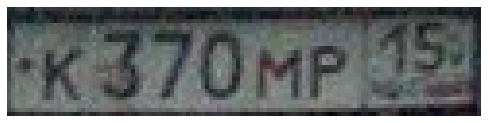

Rotated img:


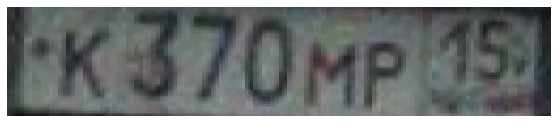

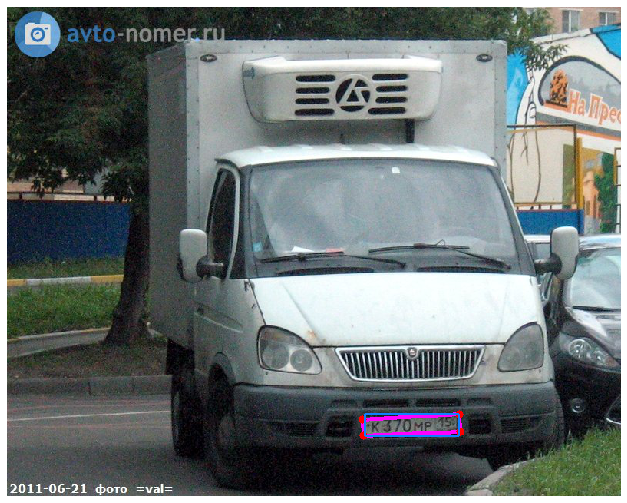

{'boxes': tensor([[466.0759, 531.2773, 588.1929, 559.1946]], device='cuda:0'),
 'labels': tensor([1], device='cuda:0'),
 'scores': tensor([0.9987], device='cuda:0'),
 'masks': tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]]]], device='cuda:0')}

In [74]:
visualize_prediction_plate(np.random.choice(test_images), model, id_to_name={1: 'plate'}, thresh=0.95)

### d) Предсказываем bounding box-ы и маску. 

- Маску превращаем в 4-угольный полигон. Сохраняем предсказания в json
- Если маска не приближается 4-угольником (редко такое бывает, бинарный поиск по гиперпараметру не работает), то просто записываем координаты bounding box 

In [75]:
THRESHOLD_SCORE = 0.90
TRESHOLD_MASK = 0.05

preds = []
model.eval()


for file in tqdm(test_images, position=0, leave=False):
    if file == './data/test/831.webp':
        pred = {}
        pred['file'] = file
        pred['nums'] = [{
            'box': [[0, 0], [0, 0], [1, 1],[1, 1]],
            'bbox': [0, 0, 1, 1],}
        ]
        preds.append(pred)
        continue
    img = Image.open(file).convert('RGB')
    img_tensor = my_detect_transforms(img)
    with torch.no_grad():
        predictions = model([img_tensor.to(device)])
    prediction = predictions[0]

    pred = dict()
    pred['file'] = file
    pred['nums'] = []

    for i in range(len(prediction['boxes'])):
        x_min, y_min, x_max, y_max = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        mask = prediction['masks'][i][0, :, :].cpu().numpy()

        if score > THRESHOLD_SCORE:            
            # В разных версиях opencv этот метод возвращает разное число параметров
            # contours,_ = cv2.findContours((mask > TRESHOLD_MASK).astype(np.uint8), 1, 1)
            _,contours,_ = cv2.findContours((mask > TRESHOLD_MASK).astype(np.uint8), 1, 1)
            approx = simplify_contour(contours[0], n_corners=4)
            
            if approx is None:
                x0, y0 = x_min, y_min
                x1, y1 = x_max, y_min
                x2, y2 = x_min, y_max
                x3, y3 = x_max, y_max
            else:
                x0, y0 = approx[0][0][0], approx[0][0][1]
                x1, y1 = approx[1][0][0], approx[1][0][1]
                x2, y2 = approx[2][0][0], approx[2][0][1]
                x3, y3 = approx[3][0][0], approx[3][0][1]
                
            points = [[x0, y0], [x2, y2], [x1, y1],[x3, y3]]

            pred['nums'].append({
                'box': points,
                'bbox': [x_min, y_min, x_max, y_max],
            })

    preds.append(pred)   

    
with open(os.path.join(DATA_PATH, 'test.json'), 'w') as json_file:
    json.dump(preds, json_file, cls=npEncoder)

simplify_contour didnt coverege
simplify_contour didnt coverege
simplify_contour didnt coverege
simplify_contour didnt coverege
simplify_contour didnt coverege


# 2. Распознаем номера

### a) Датасет для распознавания номеров

Из особенностей - на каждый номер мы генерируем bounding box + вырезаем по точкам и превращаем в прямоугольник наш 4-угольник по данным точкам. Т.е. 2 картинки на номер.

In [8]:
    
my_ocr_transforms = transforms.Compose([
    Resize(size=(320, 64)),
    transforms.ToTensor()
])

def get_vocab_from_marks(marks):
    train_texts = []
    for item in marks:
        for num in item['nums']:
            train_texts.append(num['text'])

    counts = Counter(''.join(train_texts))
    alphabet = ''.join(set(''.join(train_texts)))
    corted_counts = sorted(counts.items(), key=lambda x: x[1], reverse=True)
    char_to_idx = {item[0]: idx + 1 for idx, item in enumerate(corted_counts)}
    idx_to_char = {idx:char for char, idx in char_to_idx.items()}
    return char_to_idx, idx_to_char, alphabet

char_to_idx, idx_to_char, alphabet = get_vocab_from_marks(train_marks)

train_ocr_dataset = OCRDataset(
    marks=train_marks, 
    img_folder=DATA_PATH, 
    alphabet=alphabet,
    transforms=my_ocr_transforms
)
val_ocr_dataset = OCRDataset(
    marks=val_marks, 
    img_folder=DATA_PATH, 
    alphabet=alphabet,
    transforms=my_ocr_transforms
)

def collate_fn_ocr(batch):
    """Function for torch.utils.data.Dataloader for batch collecting.
    Accepts list of dataset __get_item__ return values (dicts).
    Returns dict with same keys but values are either torch.Tensors of batched images, sequences, and so.
    """
    images, seqs, seq_lens, texts = [], [], [], []
    for sample in batch:
        images.append(sample["img"])
        seqs.extend(sample["seq"])
        seq_lens.append(sample["seq_len"])
        texts.append(sample["text"])
    images = torch.stack(images)
    seqs = torch.Tensor(seqs).int()
    seq_lens = torch.Tensor(seq_lens).int()
    batch = {"image": images, "seq": seqs, "seq_len": seq_lens, "text": texts}
    return batch

train_ocr_loader = DataLoader(
    train_ocr_dataset, 
    batch_size=BATCH_SIZE_OCR, 
    drop_last=True,
    num_workers=0, # Почему-то у меня виснет DataLoader, если запустить несколько потоков
    collate_fn=collate_fn_ocr,
    timeout=0,
    shuffle=True # Чтобы повернутые дубли картинок не шли подряд
)

val_ocr_loader = DataLoader(
    val_ocr_dataset, 
    batch_size=BATCH_SIZE_OCR, 
    drop_last=False,
    num_workers=0,
    collate_fn=collate_fn_ocr, 
    timeout=0,
)



with open(ALPHABET_PATH, 'w+') as f:
    f.write(alphabet)
    
gc.collect()

0

In [9]:
alphabet




'УYс8ЕА6EtехуТCСhмp0роХОOeа7MкxBР5A1в4Н9HK2тPcaВМoКmXT3k'

### b) Модель для распознования текста номера

Взял RCNN из семинара

In [10]:
# from models import CRNN

### c) Обучаем модель для распознавания текста номера

In [43]:
with open(ALPHABET_PATH, 'r') as f:
    alphabet = f.readline()
    
# УYс8ЕА6EtехуТCСhмp0роХОOeа7MкxBР5A1в4Н9HK2тPcaВМoКmXT3k
    
crnn = CRNN(alphabet)

crnn.load_state_dict(torch.load(os.path.join(MODEL_PATH, 'new_ocr2.pt')))


crnn.to(device);
writer = SummaryWriter(f'./runs/{ocr_name}_12')

In [39]:
def ocr_validate(model, loader, device):
    model.eval()
    val_losses = []
    for i, b in enumerate(loader):
        images = b["image"].to(device)
        seqs_gt = b["seq"]
        seq_lens_gt = b["seq_len"]

        with torch.no_grad():
            seqs_pred = model(images).cpu()
        log_probs = F.log_softmax(seqs_pred, dim=2)
        seq_lens_pred = torch.Tensor([seqs_pred.size(0)] * seqs_pred.size(1)).int()

        loss = F.ctc_loss(log_probs=log_probs,  # (T, N, C)
                        targets=seqs_gt,  # N, S or sum(target_lengths)
                        input_lengths=seq_lens_pred,  # N
                        target_lengths=seq_lens_gt)  # N

        val_losses.append(loss.item())

    return np.mean(val_losses)
    

In [40]:
optimizer = torch.optim.Adam(crnn.parameters(), lr=3e-5, amsgrad=True, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2, factor=0.5, verbose=True)

In [41]:
crnn.train()
best_loss = 1e6;

NUM_EPOCHS = 25
iter_counter = 0

for epoch in range(NUM_EPOCHS):
    epoch_losses = []
    
    train_losses = []
    val_losses = []
    
    print_loss = []
    
    for i, batch in enumerate(tqdm(train_ocr_loader, total=len(train_ocr_loader), leave=True, position=0)):
        images = batch["image"].to(device)
        seqs_gt = batch["seq"]
        seq_lens_gt = batch["seq_len"]

        seqs_pred = crnn(images).cpu()
        log_probs = F.log_softmax(seqs_pred, dim=2)
        seq_lens_pred = torch.Tensor([seqs_pred.size(0)] * seqs_pred.size(1)).int()

        loss = F.ctc_loss(
            log_probs=log_probs,  # (T, N, C)
            targets=seqs_gt,  # N, S or sum(target_lengths)
            input_lengths=seq_lens_pred,  # N
            target_lengths=seq_lens_gt # N
        )  

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        print_loss.append(loss.item())
        
        if (i + 1) % 500 == 0:
            mean_loss = np.mean(print_loss)
            train_losses.append(mean_loss)
            
            print(f'validation at {iter_counter}')
            val_loss = ocr_validate(crnn, val_ocr_loader, device)
            val_losses.append(val_loss)
            crnn.train()
            
            scheduler.step(mean_loss)
            print_loss = []
            
            writer.add_scalar('Loss/train', mean_loss, iter_counter)
            writer.add_scalar('Loss/val', val_loss, iter_counter)
            
            if best_loss > val_loss:
                best_loss = val_loss
                torch.save(crnn.state_dict(), OCR_MODEL_PATH)
                
        iter_counter += 1
        epoch_losses.append(loss.item())
        writer.add_scalar('train iter/iter', loss.item(), iter_counter)

#     print(i, np.mean(epoch_losses))

validation at 499
validation at 999
validation at 1499
validation at 1999
validation at 2499
validation at 2999



validation at 3515
validation at 4015
validation at 4515
validation at 5015
validation at 5515
validation at 6015



validation at 6531
validation at 7031
validation at 7531
validation at 8031
validation at 8531
validation at 9031



validation at 9547
validation at 10047
validation at 10547
validation at 11047
validation at 11547
validation at 12047



validation at 12563
validation at 13063
validation at 13563
validation at 14063
validation at 14563
validation at 15063
Epoch    30: reducing learning rate of group 0 to 1.5000e-05.



validation at 15579
validation at 16079
validation at 16579
validation at 17079
validation at 17579
validation at 18079



validation at 18595
validation at 19095
validation at 19595
validation at 20095
validation at 20595
Epoch    41: reducing learning rate of group 0 to 7.5000e-06.
validation at 21095



validation at 21611
validation at 22111
validation at 22611
validation at 23111
validation at 23611
Epoch    47: reducing learning rate of group 0 to 3.7500e-06.
validation at 24111



validation at 24627
validation at 25127
validation at 25627
validation at 26127
validation at 26627
Epoch    53: reducing learning rate of group 0 to 1.8750e-06.
validation at 27127



validation at 27643
validation at 28143
Epoch    56: reducing learning rate of group 0 to 9.3750e-07.
validation at 28643
validation at 29143
validation at 29643
validation at 30143



validation at 30659
validation at 31159
Epoch    62: reducing learning rate of group 0 to 4.6875e-07.
validation at 31659
validation at 32159
validation at 32659
validation at 33159
Epoch    66: reducing learning rate of group 0 to 2.3438e-07.



validation at 33675
validation at 34175
validation at 34675
Epoch    69: reducing learning rate of group 0 to 1.1719e-07.
validation at 35175
validation at 35675
validation at 36175
Epoch    72: reducing learning rate of group 0 to 5.8594e-08.



validation at 36691
validation at 37191
validation at 37691
Epoch    75: reducing learning rate of group 0 to 2.9297e-08.
validation at 38191
validation at 38691
validation at 39191
Epoch    78: reducing learning rate of group 0 to 1.4648e-08.



validation at 39707
validation at 40207
validation at 40707
validation at 41207
validation at 41707
validation at 42207



validation at 42723
validation at 43223
validation at 43723
validation at 44223
validation at 44723
validation at 45223



validation at 45739
validation at 46239
validation at 46739
validation at 47239
validation at 47739
validation at 48239



validation at 48755
validation at 49255
validation at 49755
validation at 50255
validation at 50755
validation at 51255



validation at 51771
validation at 52271
validation at 52771


KeyboardInterrupt: 

In [23]:
# torch.save(crnn.state_dict(), OCR_MODEL_PATH)
writer.close()

In [44]:
torch.cuda.empty_cache()
gc.collect()

crnn = CRNN(alphabet)
crnn.load_state_dict(torch.load(OCR_MODEL_PATH))
crnn.to(device);

In [45]:
OCR_MODEL_PATH

'./models/17_06/new_ocr2.pt'

### d) Наконец, делаем предсказания

In [76]:
test_marks = load_json(os.path.join(DATA_PATH, 'test.json'))
crnn.eval()
resizer = Resize()

file_name_result = [] 
plates_string_result = []

for item in tqdm(test_marks, leave=False, position=0):

    img_path = item["file"]
    if img_path == './data/test/831.webp':
        file_name = img_path[img_path.find('test/'):]
        
        file_name_result.append(file_name)
        plates_string_result.append('')
        continue
        
    img = cv2.imread(img_path)
    

    results_to_sort = []
    for box in item['nums']:
        x_min, y_min, x_max, y_max = box['bbox']
        img_bbox = resizer(img[y_min:y_max, x_min:x_max])
        img_bbox = my_detect_transforms(img_bbox)
        img_bbox = img_bbox.unsqueeze(0)


        points = np.clip(np.array(box['box']), 0, None)
        img_polygon = resizer(four_point_transform(img, points))
        img_polygon = my_detect_transforms(img_polygon)
        img_polygon = img_polygon.unsqueeze(0)

        preds_bbox = crnn(img_bbox.to(device)).cpu().detach()
        preds_poly = crnn(img_polygon.to(device)).cpu().detach()

        preds = preds_poly + preds_bbox
        num_text = decode(preds, alphabet)[0]

        results_to_sort.append((x_min, num_text))

    results = sorted(results_to_sort, key=lambda x: x[0])
    num_list = [x[1] for x in results]

    plates_string = ' '.join(num_list)
    file_name = img_path[img_path.find('test/'):]

    file_name_result.append(file_name)
    plates_string_result.append(plates_string)
    
df_submit = pd.DataFrame({'file_name': file_name_result, 'plates_string': plates_string_result})
df_submit.to_csv(sub_file_name, index=False)

In [49]:
empty = df_submit[df_submit['plates_string'] == '']
empty['file_name'].values

array(['test/1015.jpeg', 'test/1323.jpg', 'test/2303.jpg', 'test/721.jpg',
       'test/791.jpg', 'test/831.webp', 'test/1087.bmp', 'test/1143.jpg',
       'test/1337.png', 'test/1465.png', 'test/1500.jpg', 'test/1522.jpg',
       'test/1586.jpg', 'test/1610.bmp', 'test/166.jpg', 'test/1664.png',
       'test/185.jpeg', 'test/1855.jpg', 'test/2081.jpg', 'test/2237.jpg',
       'test/2249.jpg', 'test/2824.jpg', 'test/2925.bmp', 'test/2926.jpg',
       'test/2931.jpg', 'test/2972.jpg'], dtype=object)

./data/test/1015.jpeg
Class: plate, Confidence: 0.909425675868988
Bounding box:


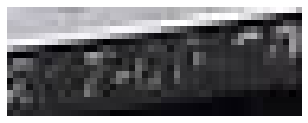

Rotated img:


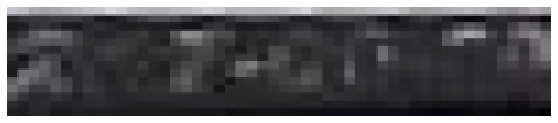

Class: plate, Confidence: 0.7970198392868042
Bounding box:


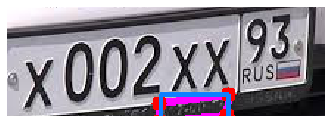

Rotated img:


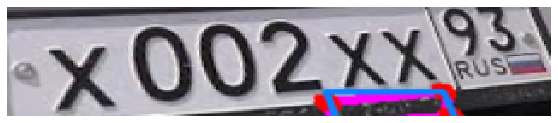

Class: plate, Confidence: 0.7308670282363892
Bounding box:


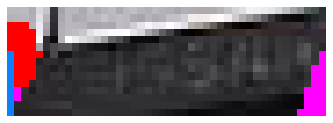

Rotated img:


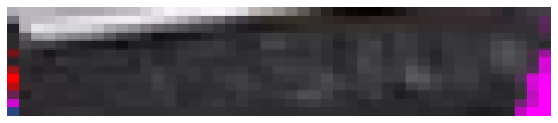

Class: plate, Confidence: 0.7078999876976013
Bounding box:


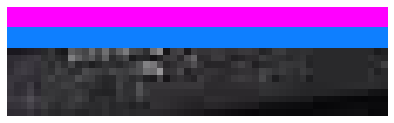

Rotated img:


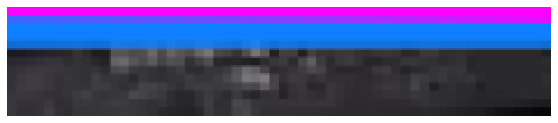

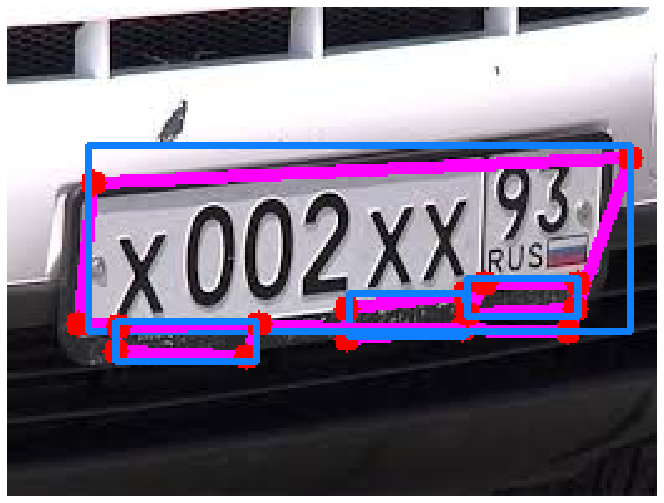

./data/test/1323.jpg
Class: plate, Confidence: 0.9184991717338562
Bounding box:


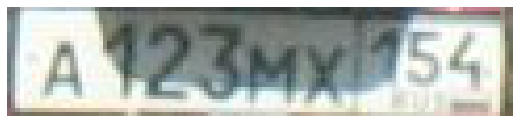

Rotated img:


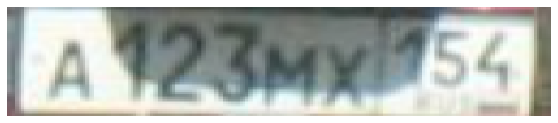

Class: plate, Confidence: 0.6368716955184937
Bounding box:


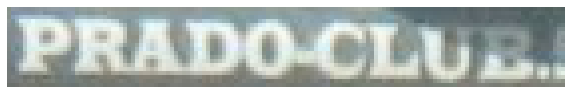

Rotated img:


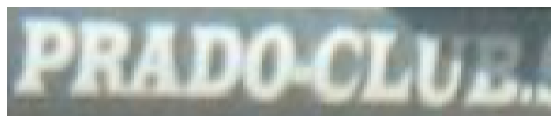

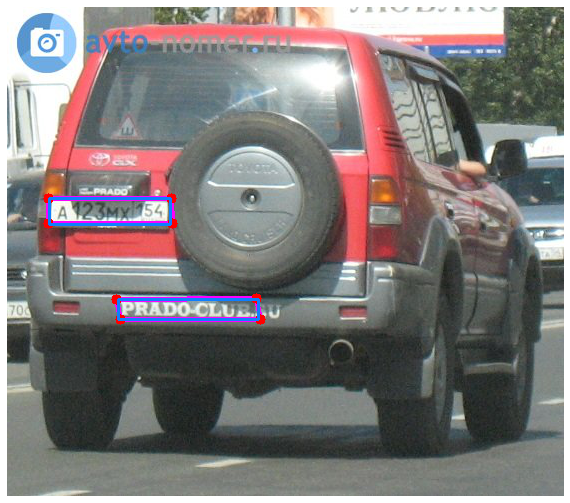

./data/test/2303.jpg


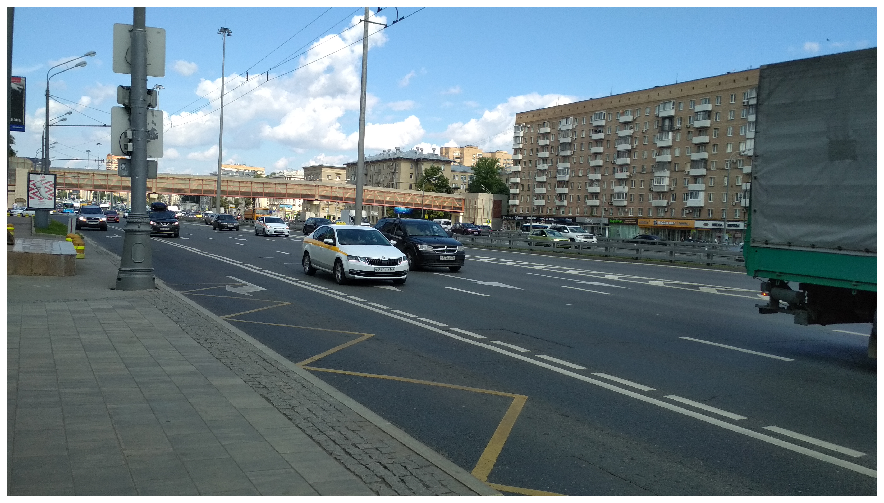

./data/test/721.jpg
Class: plate, Confidence: 0.870774507522583
Bounding box:


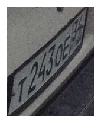

Rotated img:


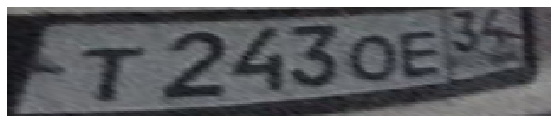

Class: plate, Confidence: 0.8224397301673889
Bounding box:


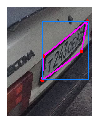

Rotated img:


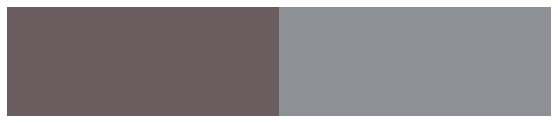

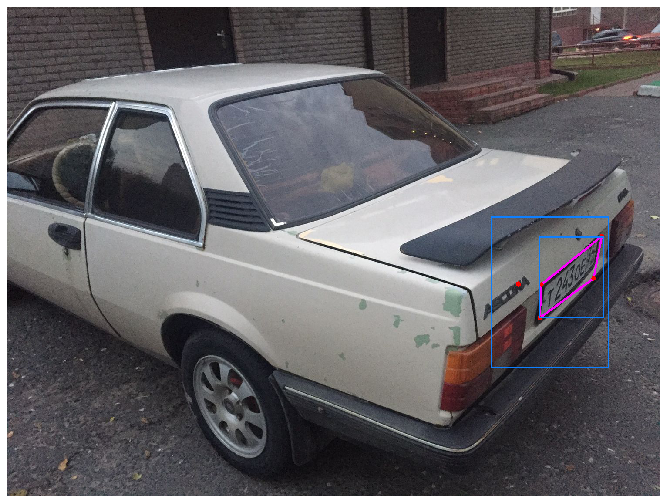

./data/test/791.jpg


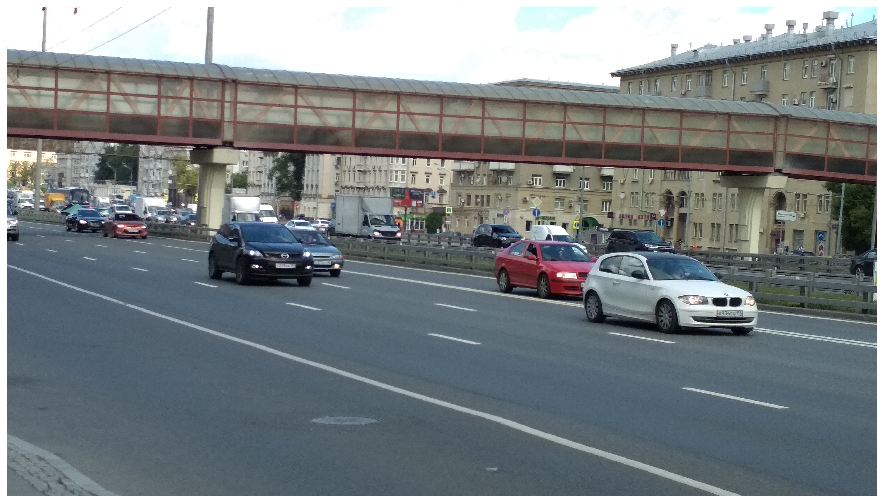

./data/test/1087.bmp
Class: plate, Confidence: 0.8451359272003174
Bounding box:


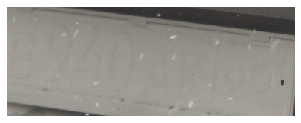

Rotated img:


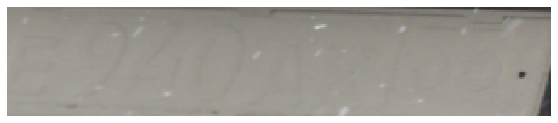

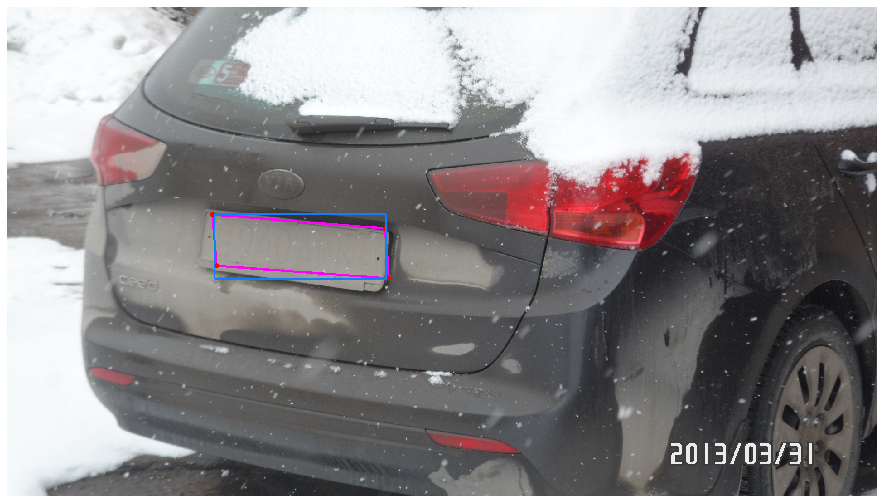

./data/test/1143.jpg
Class: plate, Confidence: 0.7375972270965576
Bounding box:


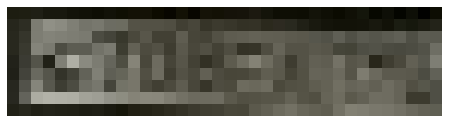

Rotated img:


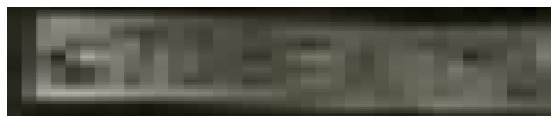

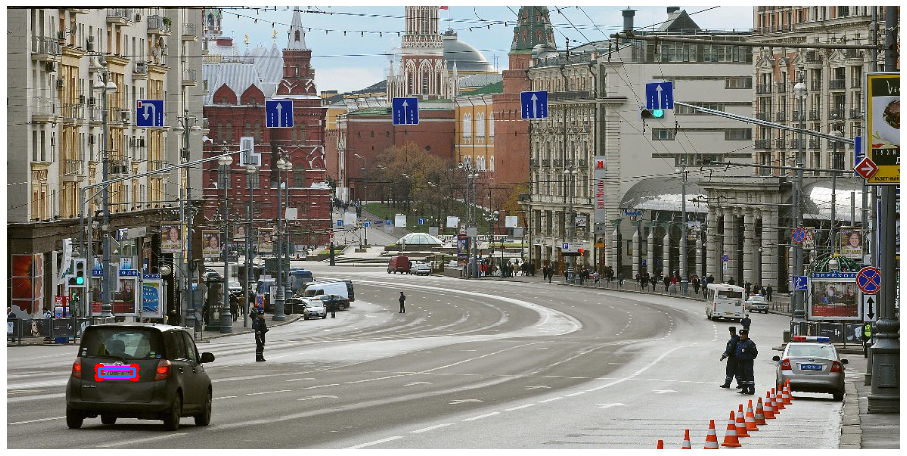

./data/test/1500.jpg


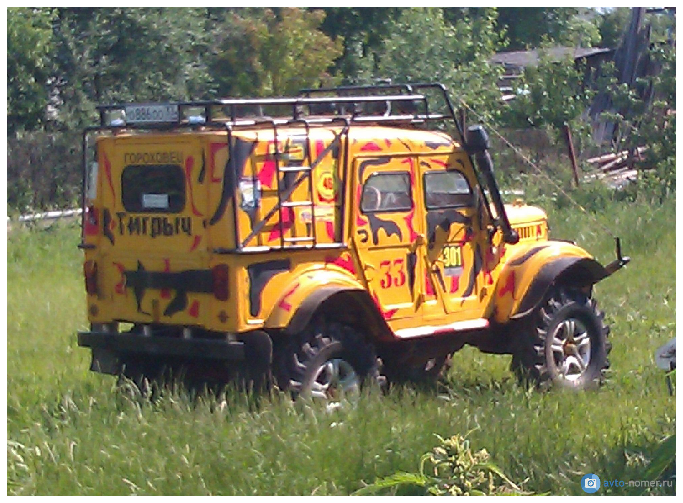

./data/test/1522.jpg
Class: plate, Confidence: 0.9263284206390381
Bounding box:


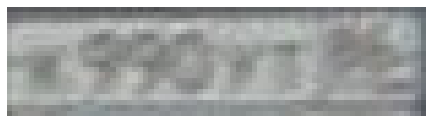

Rotated img:


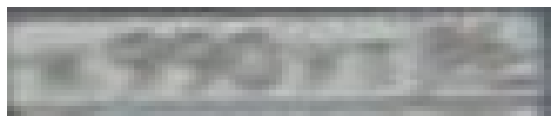

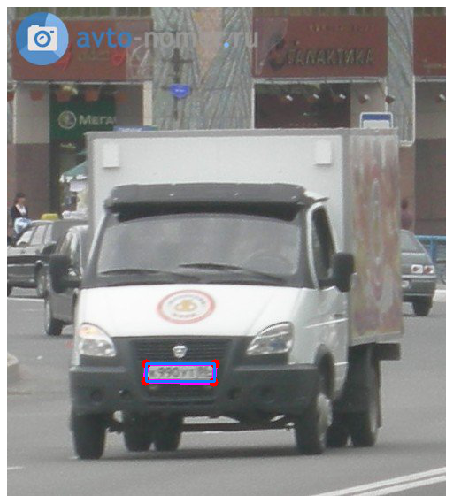

./data/test/1586.jpg
Class: plate, Confidence: 0.8896498680114746
Bounding box:


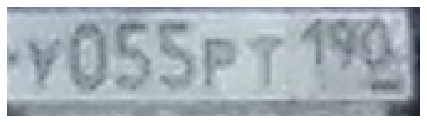

Rotated img:


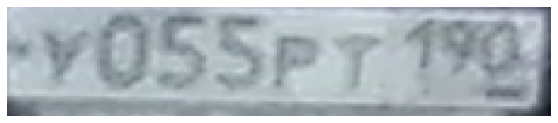

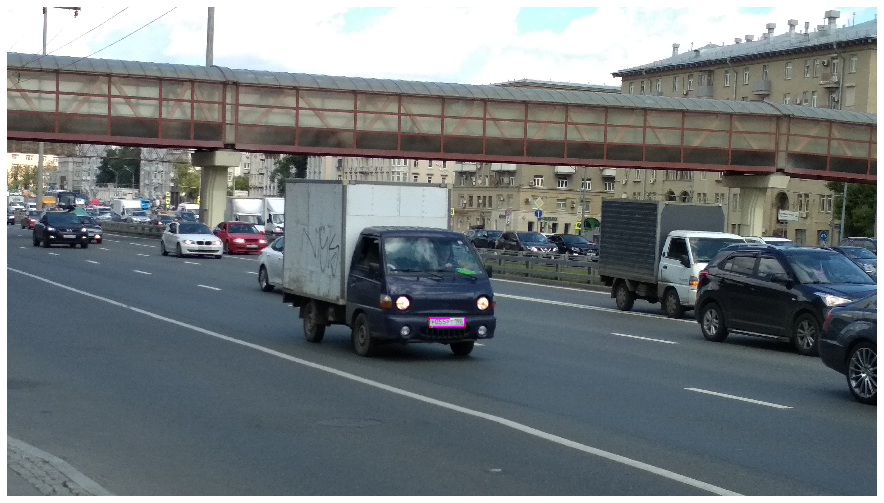

./data/test/1610.bmp
Class: plate, Confidence: 0.8213698267936707
Bounding box:


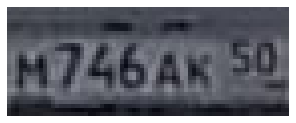

Rotated img:


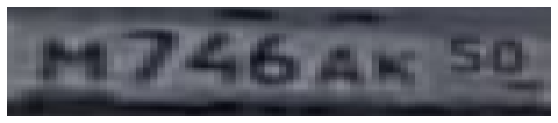

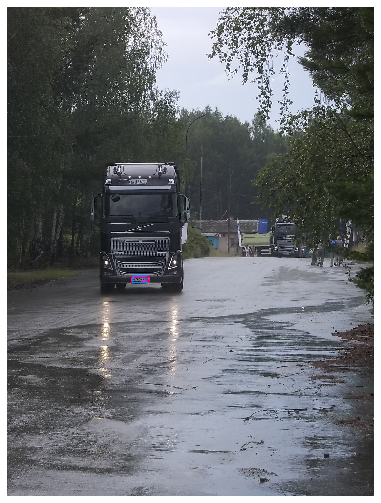

./data/test/166.jpg


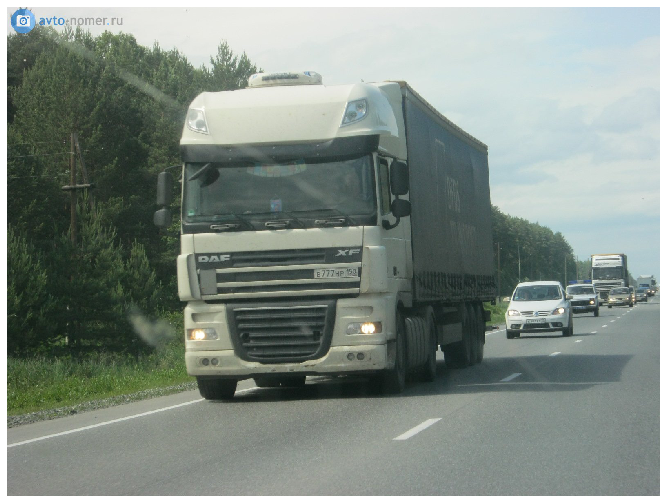

./data/test/185.jpeg
Class: plate, Confidence: 0.8444223403930664
Bounding box:


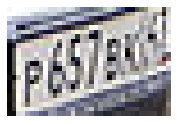

Rotated img:


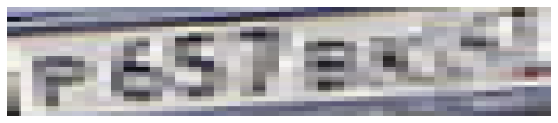

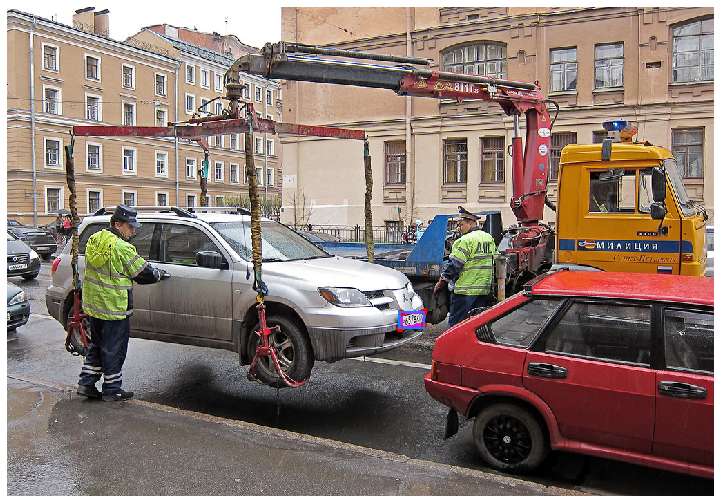

./data/test/1855.jpg
Class: plate, Confidence: 0.8420380353927612
Bounding box:


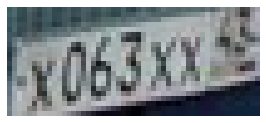

Rotated img:


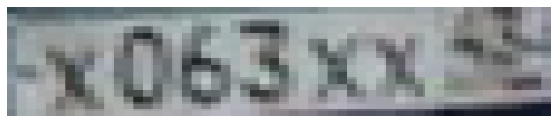

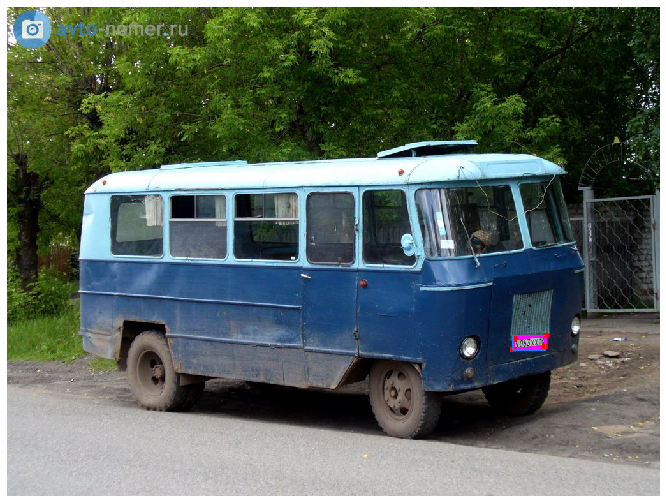

./data/test/2081.jpg
Class: plate, Confidence: 0.8909488916397095
Bounding box:


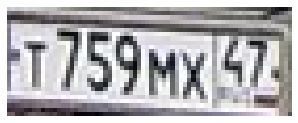

Rotated img:


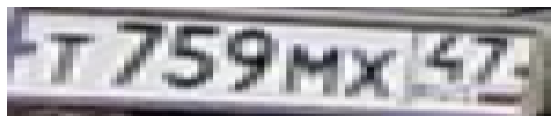

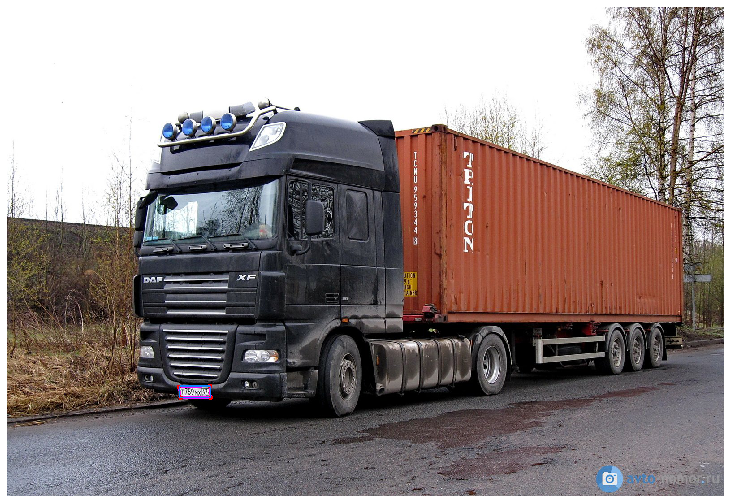

./data/test/2237.jpg
Class: plate, Confidence: 0.6948859095573425
Bounding box:


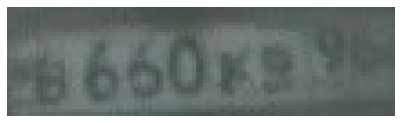

Rotated img:


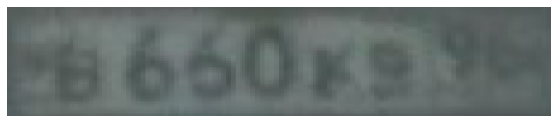

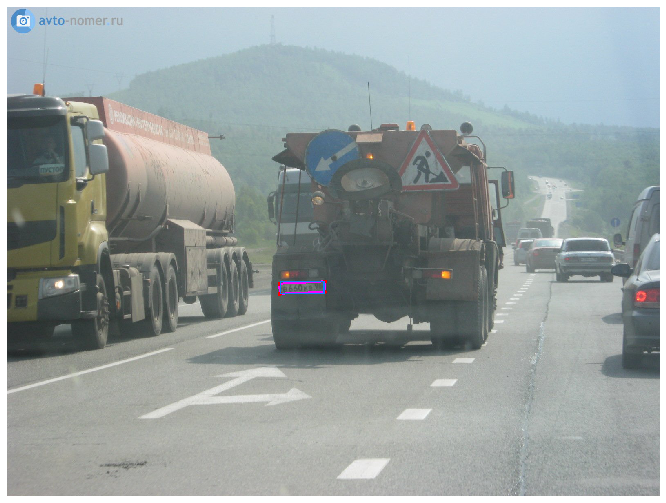

./data/test/2249.jpg
Class: plate, Confidence: 0.635999858379364
Bounding box:


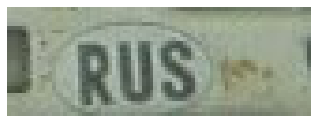

Rotated img:


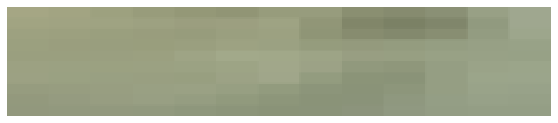

Class: plate, Confidence: 0.6327792406082153
Bounding box:


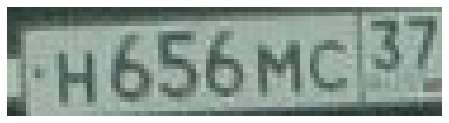

Rotated img:


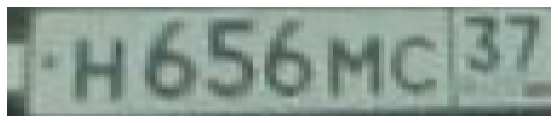

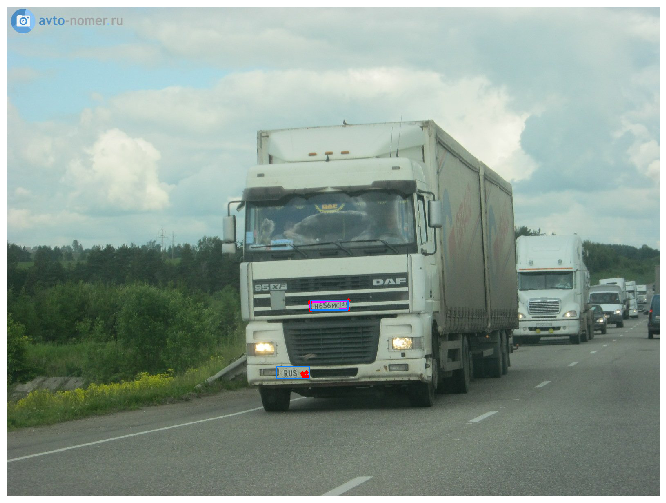

./data/test/2824.jpg
Class: plate, Confidence: 0.9121809005737305
Bounding box:


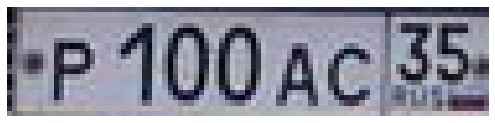

Rotated img:


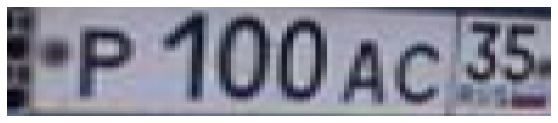

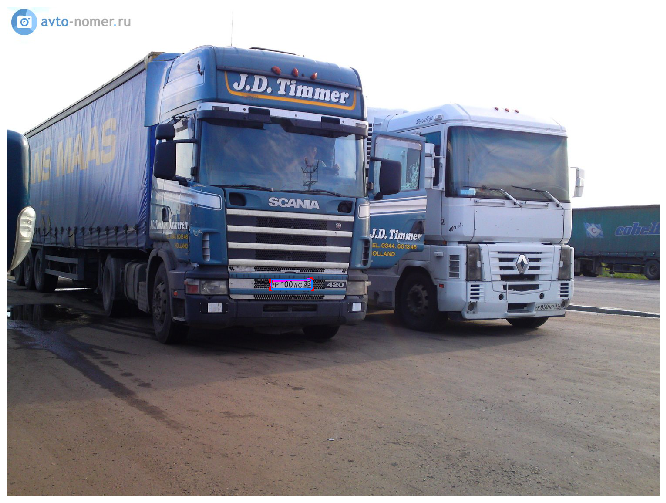

./data/test/2925.bmp
Class: plate, Confidence: 0.9286467432975769
Bounding box:


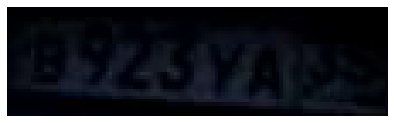

Rotated img:


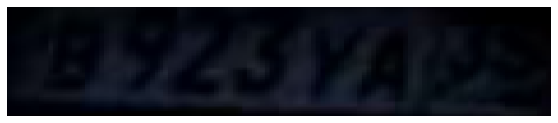

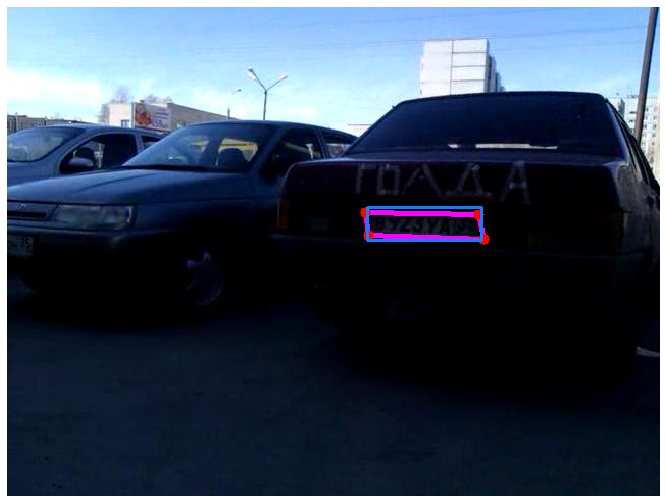

./data/test/2926.jpg
Class: plate, Confidence: 0.839496910572052
Bounding box:


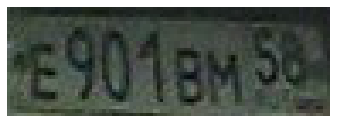

Rotated img:


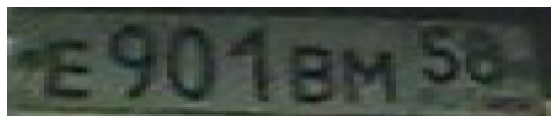

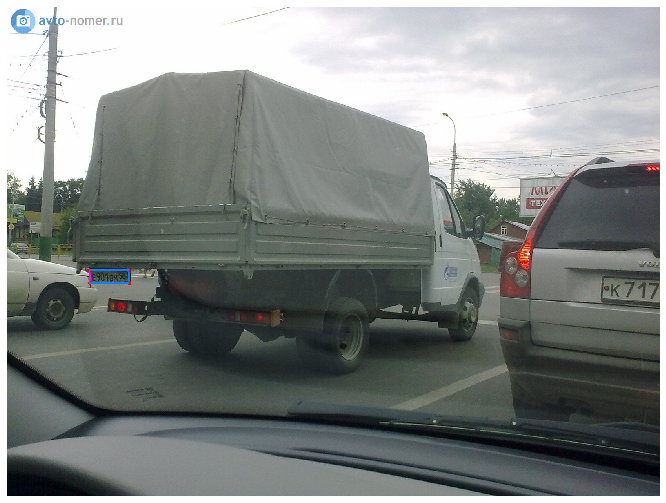

./data/test/2931.jpg
Class: plate, Confidence: 0.9186062812805176
Bounding box:


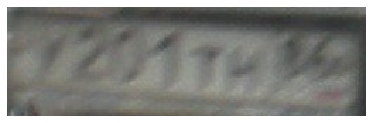

Rotated img:


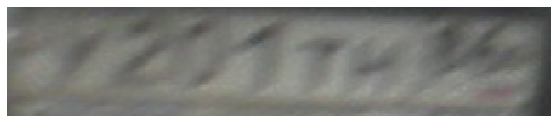

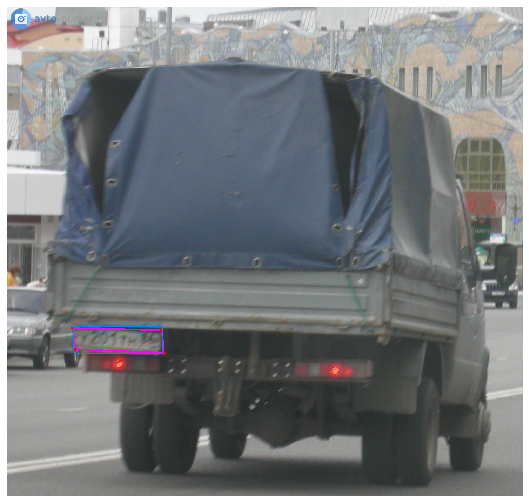

./data/test/2972.jpg
Class: plate, Confidence: 0.8092204928398132
Bounding box:


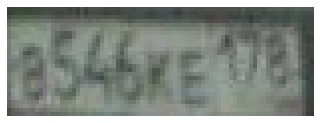

Rotated img:


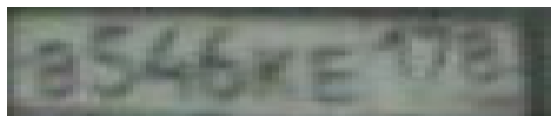

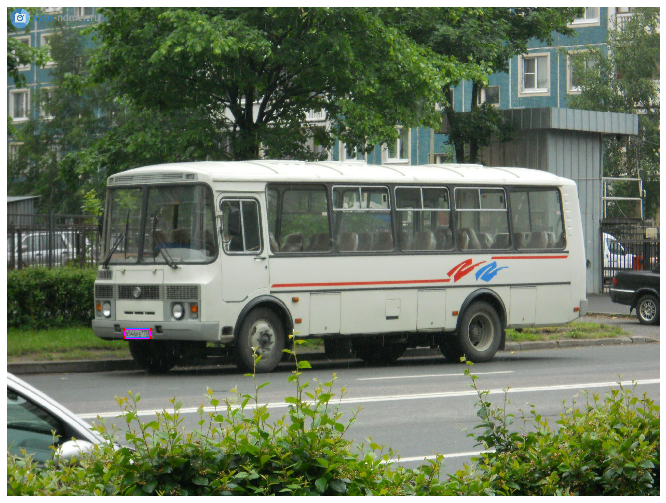

In [70]:
for name in empty['file_name'].values:
    name = './data/' + name
    if name == './data/test/831.webp' or \
       name == './data/test/1337.png' or \
       name == './data/test/1664.png' or \
       name == './data/test/1465.png':
        continue
    print(name)
    visualize_prediction_plate(name, model, id_to_name={1: 'plate'}, thresh=0.6)